In [75]:
import pandas as pd
from ..functions_shortcut.cleaning_function import * 
import numpy as np
import random
np.random.seed(222)
random.seed(222)
import matplotlib.pyplot as plt


data = pd.read_csv('cvrm_master.csv')
data.replace([np.inf, -np.inf], np.nan, inplace=True)

# Clean up and general motivations, and also maps


In [76]:
print(list(data.columns))

['statecounty_x', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2016', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2017', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2018', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2019', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2020', 'Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2021', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2016', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2017', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2018', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2019', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2020', 'Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2021', 'Populations_Vulnerable_to_Predicted_Surface_Smoke_from_Wildland_Fires_NOAA2020', 'AirPollutant: 1,3-butadiene_ug/m^3_EPA2018', 'AirPoll

In [77]:
fips = data['fips']
longitude = data['Longitude']
latitude = data['Latitude']

drop_cols = ['fips', 'Sort [1]', 'FIPS', 'Unnamed: 0', 'Longitude', 'Latitude',
             'Land Area km²', 'Land Area mi²', 'Water Area km²', 'Water Area mi²', 
             'Total Area km²', 'Total Area mi²']
data = data.drop(columns=[col for col in drop_cols if col in data.columns])




In [78]:
data['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'].isnull().sum()

67

In [79]:
# data = data.replace(np.inf, np.nan, inplace=True)
data_less_nan = drop_null_columns(data, 0.3)
data_less_corr = data_less_nan

In [80]:
all_race = exclude_columns(data_less_corr,['single_race', 'nhpi', 'asian', 'aian', 'black'])
# for col in all_race.columns:
#     print(col)

all_race.shape

(3143, 503)

In [81]:
all_race_clean = KNN_single_columns_imputation_numeric(all_race, None, 10)

In [82]:
response_set = include_columns(all_race_clean, ['outcome'])
response_set.isnull().sum()

HealthOutcome_percent_pop_with_highcholesterol_PLACES_BRFSS_2021            0
HealthOutcome_percent_pop_with_stroke_PLACES_BRFSS_2021                     0
HealthOutcome_health_percent_pop_with_depression_PLACES_BRFSS_2021          0
HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021    0
HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021                    0
HealthOutcome_percent_pop_with_asthma_Places_BRFSS_2021                     0
HealthOutcome_percent_pop_with_diagnosed_Diabetes_PLACES_BRFSS_2021         0
HealthOutcome_percent_pop_with_hypertension_PLACES_BRFSS_2021               0
HealthOutcome_percent_pop_with_coronary_heart_diseases_PLACES_BRFSS_2021    0
dtype: int64

In [83]:
include_columns(all_race_clean, ['state'])

,statecounty_x,State
0,01autauga,AL
1,01baldwin,AL
2,01barbour,AL
3,01bibb,AL
4,01blount,AL
...,...,...
3138,56sweetwater,WY
3139,56teton,WY
3140,56uinta,WY
3141,56washakie,WY


In [84]:
years_ahead = include_columns(data_less_corr,['2022'])
state_info = fips
state_info

0        1001
1        1003
2        1005
3        1007
4        1009
        ...  
3138    56037
3139    56039
3140    56041
3141    56043
3142    56045
Name: fips, Length: 3143, dtype: int64

In [85]:
from vega_datasets import data
import altair as alt

us_counties = alt.topo_feature(data.us_10m.url, "counties")


In [86]:

map_data = all_race_clean[['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021']]
map_data['FIPS'] = fips
map_data['Longitude'] = longitude
map_data['Latitude'] = latitude
map_data

,HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021,FIPS,Longitude,Latitude
0,38.9,1001,-86.644490,32.536382
1,37.2,1003,-87.746067,30.659218
2,43.4,1005,-85.405456,31.870670
3,39.6,1007,-87.127148,33.015893
4,37.7,1009,-86.567246,33.977448
...,...,...,...,...
3138,34.3,56037,-108.875676,41.660339
3139,21.7,56039,-110.588102,44.049321
3140,33.3,56041,-110.558947,41.284726
3141,33.6,56043,-107.669052,43.878831


In [87]:

map_data.rename(columns={
    "HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021": "HealthOutcome"
}, inplace=True)
map_data

,HealthOutcome,FIPS,Longitude,Latitude
0,38.9,1001,-86.644490,32.536382
1,37.2,1003,-87.746067,30.659218
2,43.4,1005,-85.405456,31.870670
3,39.6,1007,-87.127148,33.015893
4,37.7,1009,-86.567246,33.977448
...,...,...,...,...
3138,34.3,56037,-108.875676,41.660339
3139,21.7,56039,-110.588102,44.049321
3140,33.3,56041,-110.558947,41.284726
3141,33.6,56043,-107.669052,43.878831


In [88]:
import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "HealthOutcome:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Percent population diabetes(%)")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data, "FIPS", ["HealthOutcome"])  
).properties(
    width=500,
    height=300
).project("albersUsa")
filled_map


alt.Chart(...)

In [89]:

map_data2 = all_race_clean[['Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020']]
map_data2['FIPS'] = fips
map_data2['Longitude'] = longitude
map_data2['Latitude'] = latitude



map_data2.rename(columns={
    'Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020': "HeatWave"
}, inplace=True)
map_data2

,HeatWave,FIPS,Longitude,Latitude
0,2.697100e-10,1001,-86.644490,32.536382
1,6.087870e-10,1003,-87.746067,30.659218
2,2.697100e-10,1005,-85.405456,31.870670
3,2.697100e-10,1007,-87.127148,33.015893
4,2.697100e-10,1009,-86.567246,33.977448
...,...,...,...,...
3138,3.537483e-05,56037,-108.875676,41.660339
3139,3.537483e-05,56039,-110.588102,44.049321
3140,3.537483e-05,56041,-110.558947,41.284726
3141,3.537483e-05,56043,-107.669052,43.878831


In [90]:
import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "HeatWave:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Heat Wave Loss Ratio")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data2, "FIPS", ["HeatWave"])  
).properties(
    width=500,
    height=300
).project("albersUsa")
filled_map

alt.Chart(...)

In [91]:
map_data3 = all_race_clean[['Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20']]
map_data3['FIPS'] = fips
map_data3['Longitude'] = longitude
map_data3['Latitude'] = latitude



map_data3.rename(columns={
    'Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20': "Transportation Occupation"
}, inplace=True)
map_data3


,Transportation Occupation,FIPS,Longitude,Latitude
0,0.0849,1001,-86.644490,32.536382
1,0.0705,1003,-87.746067,30.659218
2,0.0970,1005,-85.405456,31.870670
3,0.1046,1007,-87.127148,33.015893
4,0.1091,1009,-86.567246,33.977448
...,...,...,...,...
3138,0.1041,56037,-108.875676,41.660339
3139,0.0606,56039,-110.588102,44.049321
3140,0.1022,56041,-110.558947,41.284726
3141,0.1087,56043,-107.669052,43.878831


In [92]:
us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "Transportation Occupation:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Transportation Occupation")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data3, "FIPS", ["Transportation Occupation"])  
).properties(
    width=500,
    height=300
).project("albersUsa")
filled_map

alt.Chart(...)

In [93]:
#KIDNEY
map_data4 = all_race_clean[['HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021']]
map_data4['FIPS'] = fips
map_data4['Longitude'] = longitude
map_data4['Latitude'] = latitude

map_data4.rename(columns={
    "HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021": "KidneyOutcome"
}, inplace=True)
map_data4

,KidneyOutcome,FIPS,Longitude,Latitude
0,2.9,1001,-86.644490,32.536382
1,2.7,1003,-87.746067,30.659218
2,3.7,1005,-85.405456,31.870670
3,3.1,1007,-87.127148,33.015893
4,2.9,1009,-86.567246,33.977448
...,...,...,...,...
3138,2.7,56037,-108.875676,41.660339
3139,2.3,56039,-110.588102,44.049321
3140,2.6,56041,-110.558947,41.284726
3141,2.7,56043,-107.669052,43.878831


In [94]:
us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "KidneyOutcome:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Kidney Outcome")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data4, "FIPS", ["KidneyOutcome"])  
).properties(
    width=500,
    height=300
).project("albersUsa")
filled_map

alt.Chart(...)

# Lasso and Ridge imputation

### 1. obesity:

In [95]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

y = all_race_clean['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021']
all_race_no_obe = exclude_columns(all_race_clean, ['healthoutcome'])
# all_race_no_obe = exclude_columns(all_race_clean, ['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021'])
x = all_race_no_obe.select_dtypes(include = ['number'])



scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)



from sklearn.linear_model import LassoCV, RidgeCV
lasso_cv = LassoCV(alphas=np.logspace(-4, 1, 50), cv=5, random_state=222)
ridge_cv = RidgeCV(alphas=np.logspace(-4, 1, 50), store_cv_values=True)

lasso_cv.fit(x_scaled, y)
ridge_cv.fit(x_scaled, y)
best_alpha_lasso = lasso_cv.alpha_
best_alpha_ridge = ridge_cv.alpha_

print(f"Optimal Lasso: {best_alpha_lasso}")
print(f"Optimal Ridge: {best_alpha_ridge}")





Optimal Lasso: 0.05689866029018299
Optimal Ridge: 10.0


In [96]:
# finding feature importance and store them

lasso = Lasso(alpha = best_alpha_lasso, random_state= 222)
lasso.fit(x_scaled, y)

ridge = Ridge(alpha = best_alpha_ridge, random_state= 222)
ridge.fit(x_scaled, y)

features = x.columns

lasso_importance = pd.Series(np.abs(lasso.coef_), index=features)
ridge_importance = pd.Series(np.abs(ridge.coef_), index=features)

lasso_importance = lasso_importance.sort_values(ascending=False)
ridge_importance = ridge_importance.sort_values(ascending=False)

print("Lasso Feature Importance:")
print(lasso_importance)
print("\nRidge Feature Importance:")
print(ridge_importance)


top200_lasso = list(lasso_importance.index[:200])
top200_ridge = list(ridge_importance.index[:200])
top100_lasso = list(lasso_importance.index[:100])
top100_ridge = list(ridge_importance.index[:100])
top50_lasso = list(lasso_importance.index[:50])
top50_ridge = list(ridge_importance.index[:50])

Lasso Feature Importance:
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021    1.478291
percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021              0.954353
Per_Capita_Income_In_the_Past_Year_ACS2016_20                                         0.539093
RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020                             0.509602
Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR                         0.323550
                                                                                        ...   
Total_population_Percent_Housing_With_More_than_1_Occupant_Per_Room                   0.000000
Total_population_Percent_Renter_Occupied_Housing_Units                                0.000000
Total_population_Percent_Owner_Occupied_Housing_Units                                 0.000000
Total_population_Occupied_Housing_With_More_than_1_Occupant_Per_Room                  0.000000
Population (2010)       

In [97]:
# Find common features in top 50 from both Lasso and Ridge
top_features = list(set(top50_lasso) & set(top50_ridge))
feature_ranking = {feature: top50_lasso.index(feature) + top50_ridge.index(feature) for feature in top_features}
top_10_features = sorted(feature_ranking, key=feature_ranking.get)[:10]

top_features_df = pd.DataFrame({'Top 10 Features': top_10_features})

top_features_df

,Top 10 Features
0,Risk_Behavior_percent_pop_without_leisuretime_...
1,percent_pop_taking_medicacine_for_hypertension...
2,RiskBehavior_percent_pop_sleep_less_7hr_Places...
3,Index_For_Environment_With_Access_To_Healthy_F...
4,Per_Capita_Income_In_the_Past_Year_ACS2016_20
5,API_Civilian_Noninstitutionalized_Population_F...
6,Winter_Weather_Expected_Annual_Loss_Score_NRI2020
7,HealthStatus_percent_pop_general_health_not_go...
8,Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020
9,Tornado_Expected_Annual_Loss_Score_NRI2020


In [98]:
def rank_features(lasso_list, ridge_list, top_n):
    feature_ranking = {}

    for feature in set(lasso_list) | set(ridge_list):  # Union to include all features
        rank_lasso = lasso_list.index(feature) if feature in lasso_list else 200  # Penalty if missing
        rank_ridge = ridge_list.index(feature) if feature in ridge_list else 200  # Penalty if missing
        
        # Compute combined ranking score
        ranking_score = rank_lasso + rank_ridge
        
        # Prioritize Ridge when there's a tie
        if rank_lasso == rank_ridge:
            ranking_score -= 0.1  # Small adjustment to prioritize Ridge
        
        feature_ranking[feature] = ranking_score

    # Select top N features
    return sorted(feature_ranking, key=feature_ranking.get)[:top_n]

# Apply function to get top 50 from top 100
top_50_features = rank_features(top100_lasso, top100_ridge, 50)

# Apply function to get top 100 from top 200
top_100_features = rank_features(top200_lasso, top200_ridge, 100)


# GWR

### GWR:

In [128]:
gwr_df = all_race_no_obe[top_50_features]


In [103]:
longitude

0       -86.644490
1       -87.746067
2       -85.405456
3       -87.127148
4       -86.567246
           ...    
3138   -108.875676
3139   -110.588102
3140   -110.558947
3141   -107.669052
3142   -104.570020
Name: Longitude, Length: 3143, dtype: float64

In [104]:
import numpy as np
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler


coords = np.column_stack((longitude, latitude))
y_numpy = y.values.reshape(-1, 1) 
X = gwr_df

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Select the optimal bandwidth
bandwidth = Sel_BW(coords, y_numpy, X_scaled).search()

# fit gwr model
gwr_model = GWR(coords, y_numpy, X_scaled, bandwidth)
gwr_results = gwr_model.fit()

print(gwr_results.summary())


/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=1.85381e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=1.25658e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=8.96732e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=8.20113e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=2.53843e-19): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/opt/anaconda3/lib/python3.11/site-packages/spglm/iwls.py:37: LinAlgWa

Model type                                                         Gaussian
Number of observations:                                                3143
Number of covariates:                                                    51

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                             34.317
Log-likelihood:                                                    2639.204
AIC:                                                              -5176.409
AICc:                                                             -5172.625
BIC:                                                             -24865.352
R2:                                                                   0.914
Adj. R2:                                                              0.913

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [105]:
import pandas as pd
import numpy as np

# Extract mean coefficients
mean_coefficients = gwr_results.params.mean(axis=0)


if mean_coefficients.shape[0] == len(X.columns):
    feature_names = X.columns
else:
    feature_names = X.columns if mean_coefficients.shape[0] == len(X.columns) else X.columns[1:]
coef_df = pd.DataFrame({'Feature': feature_names, 'Mean_Coefficient': mean_coefficients[-len(feature_names):]})




coef_df_sorted = coef_df.sort_values(by='Mean_Coefficient', ascending=False)

# top 10 positives
top_10_positive = coef_df_sorted.head(10)

# top 10 negatives
top_10_negative = coef_df_sorted.sort_values(by='Mean_Coefficient', ascending=True).head(10)

print("Top 10 Positive Features:**")
print(top_10_positive)

print("\nTop 10 Negative Features:**")
print(top_10_negative)


Top 10 Positive Features:**
                                              Feature  Mean_Coefficient
7   HealthStatus_percent_pop_general_health_not_go...          0.327660
23                     Tornado_Exposure_Total_NRI2020          0.123153
21  API_within_A_Mile_of_Park_Facilities_2020_CDC_...          0.062201
33            Winter_Weather_Number_of_Events_NRI2020          0.030066
30  Total_population_Take_Public_Transportation_To...          0.026845
25               Wildfire_Exposure_Population_NRI2020          0.022717
35              Net Migrants 2010s, total, ages 45-49          0.019744
36  percent_pop_with_cholesterol_screening_Places_...          0.019551
10  Percentage_Children_Eligible_For_Free_Or_Reduc...          0.018155
48  Total_population_Percentage_Households_With_Se...          0.016362

Top 10 Negative Features:**
                                              Feature  Mean_Coefficient
6     Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020        -49.495302
18     

# Nonlinear: Xgboost Shap anlysis

### obesity

In [110]:
#make sure all inputs are in correct formats
x_gd = all_race_no_obe[top_100_features]
state = all_race['State']
y_numpy = y.values.reshape(-1, 1) 

x_scaled_gd = scaler.fit_transform(x_gd)
x_scaled_gd = pd.DataFrame(x_scaled_gd, columns=x_gd.columns)
x_scaled_gd['state'] = state
x_scaled_gd['fips'] = fips

y_full_metadata = pd.DataFrame({
    'y': y_numpy.flatten(),  # Ensure y is a 1D array
    'state': x_scaled_gd['state'],  # Match state and fips from X
    'fips': x_scaled_gd['fips']
})

# X_train, X_test, y_train, y_test = train_test_split(x_scaled_gd, y_numpy, test_size=0.2, random_state=222)



In [111]:
import warnings
warnings.filterwarnings("ignore")
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error

# Perform a stratified train_test_split using the 'state' column for stratification
X_train, X_test, y_train_metadata, y_test_metadata = train_test_split(
    x_scaled_gd, y_full_metadata, test_size=0.2, random_state=222, stratify=y_full_metadata['state']
)

# Extract y_train and y_test from metadata
y_train = y_train_metadata['y'].values  
y_test = y_test_metadata['y'].values

# Preserve metadata for later analysis (e.g., LIME)
X_train_metadata = X_train[['state', 'fips']] 
X_test_metadata = X_test[['state', 'fips']]  

# Drop categorical columns before training XGBoost
X_train = X_train.drop(columns=['state', 'fips'])
X_test = X_test.drop(columns=['state', 'fips'])

# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor(
    verbosity=0,
    objective='reg:squarederror',  
    random_state=42
)

# Parameter grid for grid search
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300]
}

# Set up cross-validation using KFold
cv = KFold(n_splits=5, shuffle=True, random_state=222)

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=cv,
    n_jobs=-1
)

# Fit the grid search using the training data
grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)
print("Best CV Score (negative MSE):", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Test MSE:", mse)

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}
Best CV Score (negative MSE): -0.005910562623128317
Test MSE: 0.005980090881393167


In [112]:
import shap
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)
mean_shap = np.mean(shap_values, axis=0)

# Identify indices for top 10 positive and negative features based on mean SHAP values
top10_pos_indices = np.argsort(mean_shap)[-10:]
top10_neg_indices = np.argsort(mean_shap)[:10]

print("\nTop 10 Positive Features (increase prediction):")
for idx in top10_pos_indices[::-1]:
    print(f"{top_100_features[idx]}: Mean SHAP = {mean_shap[idx]:.4f}")

print("\nTop 10 Negative Features (decrease prediction):")
for idx in top10_neg_indices:
    print(f"{top_100_features[idx]}: Mean SHAP = {mean_shap[idx]:.4f}")


Top 10 Positive Features (increase prediction):
HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021: Mean SHAP = 0.0122
Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020: Mean SHAP = 0.0020
Male_Median_Earnings_In_the_Past_Year_ACS2016_20: Mean SHAP = 0.0008
percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021: Mean SHAP = 0.0007
percent_pop_with_cholesterol_screening_Places_BRFSS_2021: Mean SHAP = 0.0007
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021: Mean SHAP = 0.0006
Cold_Wave_Annualized_Frequency_NRI2020: Mean SHAP = 0.0004
Net Migrants 2010s, total, ages 40-44: Mean SHAP = 0.0004
Number_of_FDPIR_Available_USDA_2015: Mean SHAP = 0.0004
Percent_Population_25yrs_and_over_without_High_School_Diploma_ACS2016_20: Mean SHAP = 0.0003

Top 10 Negative Features (decrease prediction):
Percentage_Children_Eligible_For_Free_Or_Reduced_Price_Lunch_2017_18_CHR: Mean SHAP = -0.0027
percent_pop_18_64yr_old_lack_health_insurance

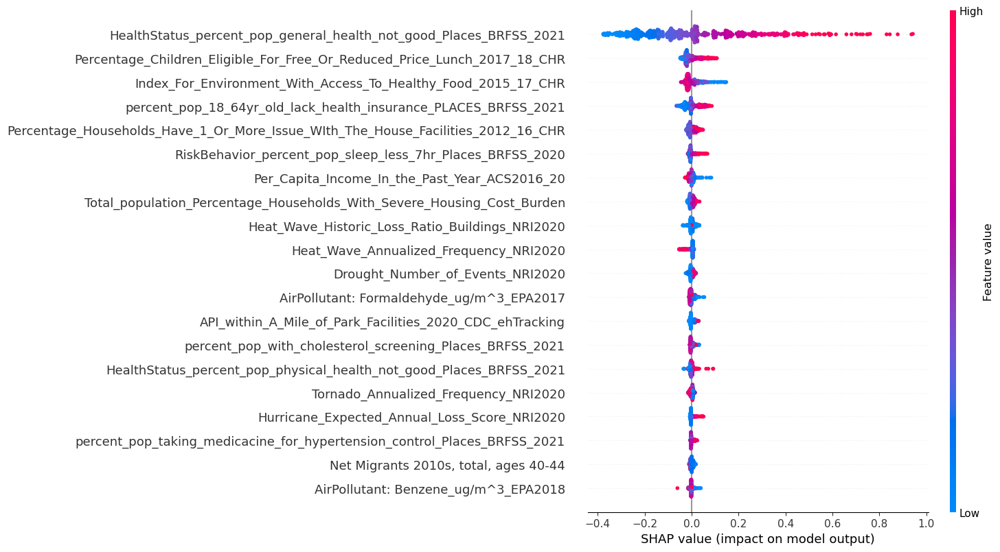

In [113]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(
    shap_values,
    X_test,
    feature_names=top_100_features,
    max_display=20
)


In [114]:
import numpy as np
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from IPython.display import display

# Define the states of interest
states_of_interest = ["IA", "SD", "MN", "MT", "WY", "ID", "UT"]


for state in states_of_interest:
    # Find indices for the chosen state
    state_indices = X_test_metadata[X_test_metadata['state'] == state].index
    
    if len(state_indices) == 0:
        print(f"No test instances found for state: {state}")
        continue
    
    # Pick the first instance from that state
    index_to_explain = state_indices[0]
    data_row = X_test.loc[index_to_explain].values
    
    # LIME prediction function (must accept 2D array)
    def predict_fn(x):
        return best_model.predict(x)
    
    # Create the LimeTabularExplainer
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=X_train.columns,
        mode='regression',  # or 'classification' as appropriate
        discretize_continuous=False
    )
    
    # Explain this single instance
    exp = explainer.explain_instance(
        data_row,
        predict_fn,
        num_features=10
    )
    
    # Display LIME explanation (bar chart + table) in the notebook
    display(exp.show_in_notebook())


None

None

None

None

None

None

None

In [115]:
print("Unique states in X_test_metadata:", X_test_metadata['state'].unique())


Unique states in X_test_metadata: ['IL' 'KY' 'NV' 'MO' 'IN' 'NJ' 'GA' 'VA' 'KS' 'OH' 'CO' 'VT' 'AR' 'WY'
 'TX' 'MS' 'SD' 'NC' 'MI' 'UT' 'LA' 'NE' 'FL' 'WA' 'NY' 'WV' 'AL' 'IA'
 'TN' 'PA' 'OR' 'OK' 'MN' 'MD' 'ID' 'NM' 'CA' 'ND' 'MA' 'CT' 'AZ' 'AK'
 'SC' 'WI' 'NH' 'MT' 'ME' 'DE' 'HI' 'RI']


# More Local Analysis